In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns

In [2]:
try:
    raw_solar = pd.read_csv('energy_dataset.csv')
    raw_weather = pd.read_csv('weather_features.csv')
except FileNotFoundError as e:
    print(e)
    print('Attempting to read datasets from online csv files on Github')
    raw_solar = pd.read_csv('https://github.com/cobyoram/Thinkful_capstone_1/blob/master/energy_dataset.csv')
    raw_weather = pd.read_csv('https://github.com/cobyoram/Thinkful_capstone_1/blob/master/weather_features.csv')

In [5]:
# First, to clean up the 'time' columns, which are time str. We want them to be pd datetime objects for nice graphing

# The original data came with time-zone aware data. We don't need this for now, so we will get rid of those parts.
def strip_deltas(array):
    for i in array:
        try:
            end = i.index('+')  
        except ValueError as e:
            print(e, 'no + in array')
            end = len(array)
        array.replace(i, i[0:end], inplace=True) # Removes everything past + for data that looks like YYYY:MM:DD hh-mm-ss+hh:mm

# Remove the timezone deltas from the time strings (This part takes a while)
# strip_deltas(raw_solar['time'])
# strip_deltas(raw_weather['dt_iso'])

# Turn those columns into datetime values with date and time
raw_solar['time'] = pd.to_datetime(raw_solar['time'])
raw_weather['time'] = pd.to_datetime(raw_weather['dt_iso'])

# Create date columns using dt.date for day-wise aggregation later
raw_solar['date'] = raw_solar['time'].dt.date
raw_weather['date'] = raw_weather['time'].dt.date

In [6]:
raw_solar.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual,date
0,2015-01-01 00:00:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41,2015-01-01
1,2015-01-01 01:00:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92,2015-01-01
2,2015-01-01 02:00:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48,2015-01-01
3,2015-01-01 03:00:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32,2015-01-01
4,2015-01-01 04:00:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04,2015-01-01


In [131]:
raw_weather.tail(50)

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,time,date
178346,2018-12-29 22:00:00,Seville,283.94,283.15,285.15,1025,71,3,80,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-29 22:00:00,2018-12-29
178347,2018-12-29 23:00:00,Seville,284.94,284.15,286.15,1025,62,5,80,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-29 23:00:00,2018-12-29
178348,2018-12-30 00:00:00,Seville,284.54,284.15,285.15,1026,71,3,100,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 00:00:00,2018-12-30
178349,2018-12-30 01:00:00,Seville,283.93,283.15,285.15,1026,66,4,70,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 01:00:00,2018-12-30
178350,2018-12-30 02:00:00,Seville,283.33,282.15,285.15,1025,66,6,70,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 02:00:00,2018-12-30
178351,2018-12-30 03:00:00,Seville,282.72,281.15,285.15,1025,66,5,80,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 03:00:00,2018-12-30
178352,2018-12-30 04:00:00,Seville,283.33,282.15,285.15,1025,66,4,70,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 04:00:00,2018-12-30
178353,2018-12-30 05:00:00,Seville,282.94,282.15,284.15,1025,71,3,80,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 05:00:00,2018-12-30
178354,2018-12-30 06:00:00,Seville,282.33,281.15,284.15,1025,71,6,70,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 06:00:00,2018-12-30
178355,2018-12-30 07:00:00,Seville,281.33,280.15,283.15,1025,76,5,70,0.0,0.0,0.0,0,800,clear,sky is clear,01n,2018-12-30 07:00:00,2018-12-30


In [136]:
raw_weather[raw_weather['clouds_all'] == 100]

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon,time,date
14272,2016-08-16 10:00:00,Valencia,294.860,293.710,296.850,1077,59,2,315,0.0,0.0,0.0,100,804,clouds,overcast clouds,04d,2016-08-16 10:00:00,2016-08-16
14273,2016-08-16 11:00:00,Valencia,294.980,293.150,297.040,1077,59,2,0,0.3,0.0,0.0,100,500,rain,light rain,10d,2016-08-16 11:00:00,2016-08-16
14274,2016-08-16 12:00:00,Valencia,295.390,293.150,298.150,1078,59,3,289,0.3,0.0,0.0,100,500,rain,light rain,10d,2016-08-16 12:00:00,2016-08-16
15848,2016-10-21 01:00:00,Valencia,287.957,287.957,287.957,986,100,1,36,0.3,0.0,0.0,100,500,rain,light rain,10n,2016-10-21 01:00:00,2016-10-21
15849,2016-10-21 02:00:00,Valencia,287.957,287.957,287.957,986,100,1,36,0.3,0.0,0.0,100,500,rain,light rain,10n,2016-10-21 02:00:00,2016-10-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159140,2016-11-04 19:00:00,Seville,295.810,292.150,301.150,1016,82,1,0,0.3,0.0,0.0,100,500,rain,light rain,10n,2016-11-04 19:00:00,2016-11-04
162384,2017-03-15 00:00:00,Seville,287.460,283.150,296.150,1011,64,3,10,0.0,0.0,0.0,100,761,dust,dust,50n,2017-03-15 00:00:00,2017-03-15
171824,2018-04-07 02:00:00,Seville,286.736,286.736,286.736,1016,96,3,226,0.3,0.0,0.0,100,500,rain,light rain,10n,2018-04-07 02:00:00,2018-04-07
172193,2018-04-22 07:00:00,Seville,287.540,287.150,288.150,1012,100,1,0,0.0,0.0,0.0,100,701,mist,mist,50n,2018-04-22 07:00:00,2018-04-22


In [23]:
# Discover all weather descriptive values
print(raw_weather['weather_main'].value_counts())
print(raw_weather['weather_description'].value_counts())

clear           82685
clouds          68055
rain            17391
mist             3908
fog              2506
drizzle          1724
thunderstorm     1041
haze              435
dust              347
snow              270
smoke              33
squall              1
Name: weather_main, dtype: int64
sky is clear                    82685
few clouds                      32101
broken clouds                   17448
scattered clouds                15945
light rain                      10905
mist                             3908
moderate rain                    3621
overcast clouds                  2561
fog                              2506
light intensity drizzle          1241
heavy intensity rain             1142
light intensity shower rain       657
proximity thunderstorm            480
proximity shower rain             476
haze                              435
shower rain                       426
drizzle                           369
dust                              345
thunderstorm       

not clear 95711
clear 82685


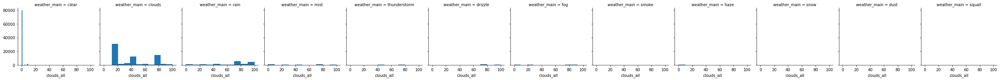

In [47]:
print('not clear', raw_weather.loc[raw_weather['weather_main'] != 'clear']['time'].count())
print('clear', raw_weather.loc[raw_weather['weather_main'] == 'clear']['time'].count())

g = sns.FacetGrid(data=raw_weather, col='weather_main')
g.map(plt.hist, 'clouds_all')

>median 119225
<median 59171


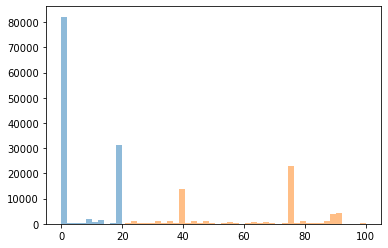

In [67]:
# Let's try using these
less_clouds = raw_weather.loc[raw_weather['clouds_all'] <= raw_weather['clouds_all'].median()]
more_clouds = raw_weather.loc[raw_weather['clouds_all'] > raw_weather['clouds_all'].median()]
print('>median', less_clouds['time'].count())
print('<median', more_clouds['time'].count())

plt.hist(less_clouds['clouds_all'], alpha=.5)
plt.hist(more_clouds['clouds_all'], alpha=.5, bins=40)
plt.show()

In [140]:
# Let's try to organize the data by date, then location, and only look at the clouds_all value
cities = raw_weather['city_name'].unique()
city_pivot_less = pd.pivot_table(less_clouds, columns='city_name', values='clouds_all', index='time')
city_pivot_less = city_pivot_less.reset_index()

(array([11405.,  1392.,  6122.,  3095.,  1697.,  4121.,  2333.,   876.,
          331.,  2800.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

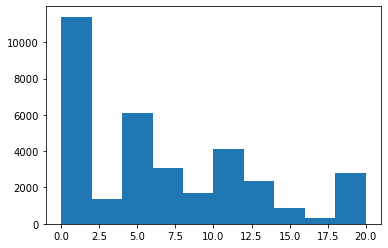

In [143]:
city_pivot_less['cloud_coverage'] = city_pivot_less[cities].aggregate('mean', axis=1)
plt.hist(city_pivot_less['cloud_coverage'])

(array([ 317.,  716., 4303., 1989., 4081., 3450., 8968., 1920., 2215.,
          37.]),
 array([ 21. ,  28.9,  36.8,  44.7,  52.6,  60.5,  68.4,  76.3,  84.2,
         92.1, 100. ]),
 <a list of 10 Patch objects>)

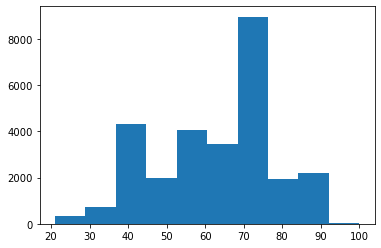

In [146]:
city_pivot_more = pd.pivot_table(more_clouds, columns='city_name', values='clouds_all', index='time')
city_pivot_more = city_pivot_more.reset_index()
city_pivot_more['cloud_coverage'] = city_pivot_more[cities].aggregate('mean', axis=1)
plt.hist(city_pivot_more['cloud_coverage'])

In [147]:
city_pivot_more.describe()

city_name,Barcelona,Bilbao,Madrid,Seville,Valencia,cloud_coverage
count,9955.000000,20981.000000,10148.000000,6877.000000,8530.000000,27996.000000
mean,59.965143,67.962347,62.680627,62.101207,59.498007,63.806793
std,21.638956,18.679947,20.455785,21.625042,20.453421,16.191574
min,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000
25%,40.000000,48.000000,40.000000,40.000000,40.000000,51.666667
50%,64.000000,75.000000,75.000000,75.000000,64.000000,66.250000
75%,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


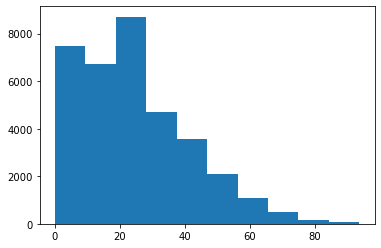

city_name,time,Barcelona,Bilbao,Madrid,Seville,Valencia,mean_coverage
0,2015-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0
1,2015-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0
2,2015-01-01 02:00:00,0.0,0.0,0.0,0.0,0.0,0.0
3,2015-01-01 03:00:00,0.0,0.0,0.0,0.0,0.0,0.0
4,2015-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0


In [171]:
clouds_cities = raw_weather.loc[:,['time', 'city_name', 'clouds_all']]
clouds_cities = clouds_cities.pivot_table(index='time', columns='city_name', values='clouds_all')
clouds_cities = clouds_cities.reset_index()
clouds_cities['mean_coverage'] = clouds_cities[cities].aggregate('mean', axis=1)
plt.hist(clouds_cities['mean_coverage'])
plt.show()
clouds_cities.head()

In [186]:
median = clouds_cities['mean_coverage'].median()

clouds_cities['category'] = 'less coverage'
clouds_cities['category'] = clouds_cities['category'].where(clouds_cities['mean_coverage'] <= median, 'more coverage')
clouds_cities

city_name,time,Barcelona,Bilbao,Madrid,Seville,Valencia,mean_coverage,category
0,2015-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
1,2015-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
2,2015-01-01 02:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
3,2015-01-01 03:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
4,2015-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
...,...,...,...,...,...,...,...,...
35055,2018-12-31 19:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
35056,2018-12-31 20:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
35057,2018-12-31 21:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage
35058,2018-12-31 22:00:00,0.0,0.0,0.0,0.0,0.0,0.0,less coverage


In [226]:
time_solar = pd.DataFrame(raw_solar.loc[:,['time','generation solar']])
time_clouds = pd.DataFrame(clouds_cities.loc[:,['time','category']])

In [227]:
time_solar

,time,generation solar
0,2015-01-01 00:00:00,49.0
1,2015-01-01 01:00:00,50.0
2,2015-01-01 02:00:00,50.0
3,2015-01-01 03:00:00,50.0
4,2015-01-01 04:00:00,42.0
...,...,...
35059,2018-12-31 19:00:00,85.0
35060,2018-12-31 20:00:00,33.0
35061,2018-12-31 21:00:00,31.0
35062,2018-12-31 22:00:00,31.0


In [228]:
time_clouds

city_name,time,category
0,2015-01-01 00:00:00,less coverage
1,2015-01-01 01:00:00,less coverage
2,2015-01-01 02:00:00,less coverage
3,2015-01-01 03:00:00,less coverage
4,2015-01-01 04:00:00,less coverage
...,...,...
35055,2018-12-31 19:00:00,less coverage
35056,2018-12-31 20:00:00,less coverage
35057,2018-12-31 21:00:00,less coverage
35058,2018-12-31 22:00:00,less coverage


In [233]:
solar_clouds = time_solar.set_index('time').join(time_clouds.set_index('time'))
solar_clouds

,generation solar,category
time,,
2015-01-01 00:00:00,49.0,less coverage
2015-01-01 01:00:00,50.0,less coverage
2015-01-01 02:00:00,50.0,less coverage
2015-01-01 03:00:00,50.0,less coverage
2015-01-01 04:00:00,42.0,less coverage
...,...,...
2018-12-31 19:00:00,85.0,less coverage
2018-12-31 20:00:00,33.0,less coverage
2018-12-31 21:00:00,31.0,less coverage


(735599.0, 737406.9665994624)

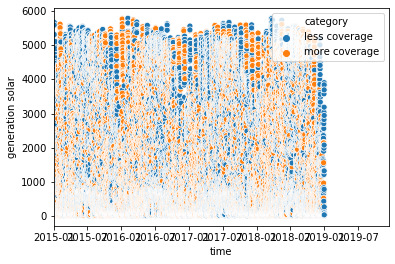

In [244]:
sns.scatterplot(x=solar_clouds.index, y='generation solar', hue='category', data=solar_clouds)
plt.xlim(pd.to_datetime('2015-01-01'), None)

C:\Python37\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Python37\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


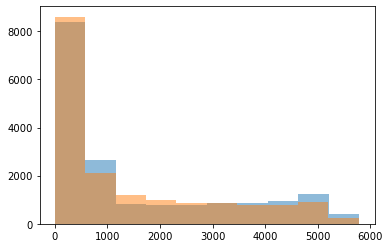

In [245]:
plt.hist(solar_clouds[solar_clouds['category'] == 'less coverage']['generation solar'], alpha=.5)
plt.hist(solar_clouds[solar_clouds['category'] == 'more coverage']['generation solar'], alpha=.5)
plt.show()

In [247]:
mwu = stats.mannwhitneyu(solar_clouds[solar_clouds['category'] == 'less coverage']['generation solar'], solar_clouds[solar_clouds['category'] == 'more coverage']['generation solar'])


MannwhitneyuResult(statistic=145466845.0, pvalue=2.387243669635767e-18)

In [257]:
less_cov = solar_clouds[solar_clouds['category'] == 'less coverage']['generation solar'].median()
print('less coverage', less_cov)
more_cov = solar_clouds[solar_clouds['category'] == 'more coverage']['generation solar'].median()
print('more coverage', more_cov)
ratio = more_cov / less_cov
print('ratio', ratio)
print('percent drop with higher coverage: {}%'.format((1 - ratio)*100))

less coverage 632.0
more coverage 594.0
ratio 0.939873417721519
percent drop with higher coverage: 6.0126582278481%


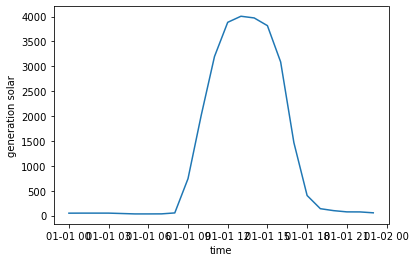

In [267]:
sns.lineplot(y='generation solar', x='time', data=solar_clouds.loc[solar_clouds.index < pd.to_datetime('2015-01-02')].reset_index())

In [272]:
daytime_solar_clouds = solar_clouds.loc[solar_clouds['generation solar'] > 500]

(array([5196., 1989., 1672., 1560., 1526., 1510., 1567., 1626., 1939.,
         488.]),
 array([ 501. , 1030.1, 1559.2, 2088.3, 2617.4, 3146.5, 3675.6, 4204.7,
        4733.8, 5262.9, 5792. ]),
 <a list of 10 Patch objects>)

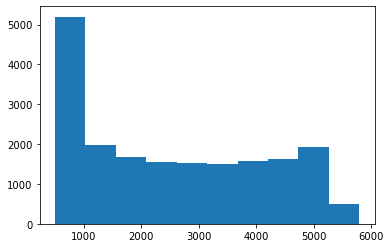

In [275]:
plt.hist(daytime_solar_clouds['generation solar'])

(735599.0, 737406.7040994624)

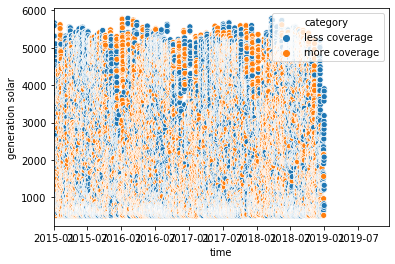

In [276]:
sns.scatterplot(x=daytime_solar_clouds.index, y='generation solar', hue='category', data=daytime_solar_clouds)
plt.xlim(pd.to_datetime('2015-01-01'), None)

In [278]:
stats.mannwhitneyu(daytime_solar_clouds[daytime_solar_clouds['category'] == 'less coverage']['generation solar'], daytime_solar_clouds[daytime_solar_clouds['category'] == 'more coverage']['generation solar'])

MannwhitneyuResult(statistic=44512425.0, pvalue=0.008653713605661676)